In [498]:
using Flight.FlightCore.Systems
using Flight.FlightCore.Plotting

using Flight.FlightPhysics
using Flight.FlightComponents
using Flight.FlightAircraft.C172
using Flight.FlightAircraft.C172FBW
using Flight.FlightAircraft.C172MCS
using Flight.FlightComponents.Control.Discrete: PIDParams
using Flight.FlightComponents.Control.PIDOpt: Settings, Metrics, optimize_PID, build_PID, check_results

using UnPack
using ControlSystems
using RobustAndOptimalControl
using ComponentArrays
using LinearAlgebra

In [499]:
ac = Cessna172FBWBase(NED()) |> System #linearization requires NED kinematics

design_point = C172.TrimParameters()
# design_point = C172.TrimParameters(EAS = 28)

#complete longitudinal model
lss_lon = Control.Continuous.LinearizedSS(ac, design_point; model = :lon);
P_lon = named_ss(lss_lon);

x_labels_lon = keys(lss_lon.x0) |> collect
y_labels_lon = keys(lss_lon.y0) |> collect
u_labels_lon = keys(lss_lon.u0) |> collect

lss_lon.A[:h, :] |> display
lss_lon.A[:, :h] |> display
lss_lon.C[:, :h] |> display


ComponentVector{Float64}(q = 0.0, θ = 52.57176296412945, v_x = 0.023550335280175867, v_z = -0.9997222499425569, h = 0.0, α_filt = 0.0, ω_eng = 0.0, thr_v = 0.0, thr_p = 0.0, ele_v = 0.0, ele_p = 0.0)

ComponentVector{Float64}(q = 6.60954228263296e-7, θ = -1.3093480728279614e-12, v_x = -1.9430531300316932e-5, v_z = 0.0009572946220013177, h = 0.0, α_filt = 0.0, ω_eng = 0.010967021085778062, thr_v = 0.0, thr_p = 0.0, ele_v = 0.0, ele_p = 0.0)

ComponentVector{Float64}(q = 0.0, θ = 0.0, v_x = 0.0, v_z = 0.0, h = 1.0, α_filt = 0.0, ω_eng = 0.0, thr_v = 0.0, thr_p = 0.0, ele_v = 0.0, ele_p = 0.0, f_x = -1.909930081594558e-5, f_z = 0.0009603649093991234, α = 0.0, EAS = -0.0024565174466087704, TAS = 0.0, γ = 0.0, climb_rate = 0.0, throttle_cmd = 0.0, elevator_cmd = 0.0)

As one would expect, $\dot{h}$ is nonzero for nonzero $\theta$. This will be a problem when designing a LQR tracker for which the choice of command variables involves non-zero steady state $\theta$. Since we cannot maintain constant altitude with an arbitrary $\theta$, true static equilibrium will not exist and the block $H_x F^{-1} G$ in the feedforward gain matrix required for tracking such command variables will be singular. This would not be an issue if we picked for instance $h$ and $EAS$ as command variables, because true equilibrium exists for an arbitrary combination of the two. However, this is not an appealing choice, because we would like to be able to control the pitch axis explicitly, rather than implicitly through $h$.

To handle this issue, we could partition the state and work with quasi-static equilibrium. However, since this is annoying, and the coupling of $h$ into the remaining states is very weak, we can simply drop $h$ from the state, design the desired LQR trackers on the reduced plant, and then connect them back to the full plant. This has a price to pay: ignoring the (small) effect of altitude causes (small) steady state errors when tracking climb-rate, EAS or throttle.

In [500]:
x_labels_red = copy(x_labels_lon)
y_labels_red = copy(y_labels_lon)
u_labels_red = copy(u_labels_lon)

x_labels_red = deleteat!(x_labels_red, findfirst(isequal(:h), x_labels_red))
y_labels_red = deleteat!(y_labels_red, findfirst(isequal(:h), y_labels_red))

#design model
lss_red = Control.Continuous.submodel(lss_lon; x = x_labels_red, u = u_labels_red, y = y_labels_red)
P_red = named_ss(lss_red);

Finally, we are extracting a model retaining only pitch dynamics for pitch SAS design. Since we are only keeping elevator command as an input, we need to drop all engine-related states to keep the system controllable.

In [501]:
x_labels_pit = [:q, :θ, :v_x, :v_z, :α_filt, :ele_v, :ele_p]
y_labels_pit = vcat(x_labels_pit, [:f_x, :f_z, :α, :EAS, :TAS, :γ, :climb_rate, :elevator_cmd])
u_labels_pit = [:elevator_cmd,]

#design model
lss_pit = Control.Continuous.submodel(lss_lon; x = x_labels_pit, u = u_labels_pit, y = y_labels_pit)
P_pit = named_ss(lss_pit);

## 1. Pitch Stability Augmentation

In [502]:
dampreport(P_lon)
dampreport(P_red)
dampreport(P_pit)
controllability(P_red)
controllability(P_pit)

|        Pole        |   Damping     |   Frequency   |   Frequency   | Time Constant |
|                    |    Ratio      |   (rad/sec)   |     (Hz)      |     (sec)     |
+--------------------+---------------+---------------+---------------+---------------+
| -0.000511          |  1            |  0.000511     |  8.14e-05     |  1.96e+03     |
| -0.0192 ±  0.233im |  0.0821       |  0.234        |  0.0372       |  52.1         |
| -5.54   ±   6.27im |  0.662        |  8.37         |  1.33         |  0.18         |
| -11.7              |  1            |  11.7         |  1.86         |  0.0857       |
| -18.8   ±   25.1im |  0.6          |  31.4         |  5            |  0.0531       |
| -18.8   ±   25.1im |  0.6          |  31.4         |  5            |  0.0531       |
| -47.2              |  1            |  47.2         |  7.51         |  0.0212       |
|        Pole        |   Damping     |   Frequency   |   Frequency   | Time Constant |
|                    |    Ratio      |   (r

(iscontrollable = true, ranks = [7, 7, 7, 7, 7, 7, 7], sigma_min = [0.004930613152567108, 3.213357064332775, 3.213357064332775, 0.4342631919592065, 0.4342631919592065, 0.03954932414967328, 0.03954932414967328])

We see that removing $h$ as a state eliminates an extremely slow pole, probably related to the effect of altitude on engine output. The remaining poles are virtually unaffected. Also, it significantly improves the condition of the dynamics matrix:

In [503]:
cond(P_lon.A) |> display
cond(P_red.A) |> display
cond(P_pit.A) |> display

1.1793569208626257e8

707509.1616281078

190726.47973591764

In [504]:
# ensure consistency in component selection and ordering between our reduced
# design model and MCS avionics implementation for state and control vectors
@assert tuple(x_labels_red...) === propertynames(C172MCS.XLon())
@assert tuple(u_labels_red...) === propertynames(C172MCS.ULon())

x_trim = lss_red.x0
u_trim = lss_red.u0

n_x = length(x_labels_red)
n_u = length(u_labels_red)

2

In [505]:
#compute a feedback matrix considering only the pitch dynamics model
@unpack v_x, v_z = lss_pit.x0
v_norm = norm([v_x, v_z])

#weight matrices
Q = ComponentVector(q = 1, θ = 20, v_x = 0.1/v_norm, v_z = 1/v_norm, α_filt = 0, ele_v = 0, ele_p = 0) |> diagm
R = ComponentVector(elevator_cmd = 2) |> diagm

#feedback gain matrix
C_fbk_pit = lqr(P_pit, Q, R)

#build a feedback matrix for the reduced system from the pitch dynamics model.
#this is done by allocating a zero feedback matrix of the size required by the
#reduced model, and then assigning those components corresponding to the pitch
#dynamics feedback matrix. in the actual implementation we don't need to define
#additional state feedback or control input vector templates. we are only using
#those for the reduced system. this will still be a 10x2x2 LQRTracker
C_fbk_red = ComponentMatrix(zeros(n_u, n_x), Axis(u_labels_red), Axis(x_labels_red))
C_fbk_red[:elevator_cmd, x_labels_pit] .= vec(C_fbk_pit)

#now we connect C_fbk_red to the reduced plant
u_labels_red_fbk = Symbol.(string.(u_labels_red) .* "_fbk")
u_labels_red_fwd = Symbol.(string.(u_labels_red) .* "_fwd")
u_labels_red_sum = Symbol.(string.(u_labels_red) .* "_sum")

C_fbk_red_ss = named_ss(ss(C_fbk_red), u = x_labels_red, y = u_labels_red_fbk)
throttle_sum = sumblock("throttle_cmd_sum = throttle_cmd_fwd - throttle_cmd_fbk")
elevator_sum = sumblock("elevator_cmd_sum = elevator_cmd_fwd - elevator_cmd_fbk")

connections = vcat(
    Pair.(x_labels_red, x_labels_red),
    Pair.(u_labels_red_fbk, u_labels_red_fbk),
    Pair.(u_labels_red_sum, u_labels_red),
    )

P_red_fbk = connect([P_red, throttle_sum, elevator_sum, C_fbk_red_ss],
    connections; w1 = u_labels_red_fwd, z1 = P_red.y)

dampreport(P_red_fbk)
display(C_fbk_red_ss)

NamedStateSpace{Continuous, Float64}
D = 
 0.0                 0.0                  0.0                    0.0                  0.0                 0.0  0.0  0.0  0.0                  0.0
 0.4907847346759576  3.1816790864851643  -0.003156669154248788  -0.04935062731068474  1.4558719885452938  0.0  0.0  0.0  0.00698465521958069  0.28738993244826133

Continuous-time state-space model
With state  names: 
     input  names: q θ v_x v_z α_filt ω_eng thr_v thr_p ele_v ele_p
     output names: throttle_cmd_fbk elevator_cmd_fbk


|        Pole        |   Damping     |   Frequency   |   Frequency   | Time Constant |
|                    |    Ratio      |   (rad/sec)   |     (Hz)      |     (sec)     |
+--------------------+---------------+---------------+---------------+---------------+
| -0.116             |  1            |  0.116        |  0.0185       |  8.61         |
| -0.798             |  1            |  0.798        |  0.127        |  1.25         |
| -8.89   ±   5.79im |  0.838        |  10.6         |  1.69         |  0.113        |
| -11.7              |  1            |  11.7         |  1.86         |  0.0857       |
| -18.8   ±   25.1im |  0.6          |  31.4         |  5            |  0.0531       |
| -18.5   ±   25.9im |  0.581        |  31.9         |  5.07         |  0.054        |
| -47.2              |  1            |  47.2         |  7.5          |  0.0212       |


In [543]:
#Now, we compute the feedforward matrices from the closed loop reduced system.
#This is simply the relation from y_sp to u_sp given by Stengel 6.2-13 without
#disturbances. Here, we are dealing with a plant with already embedded feedback.
z_labels = [:throttle_cmd, :elevator_cmd]
@assert tuple(z_labels...) === propertynames(C172MCS.ZLonThrEle())
z_trim = lss_red.y0[z_labels]
n_z = length(z_labels)
z_labels_sp = Symbol.(string.(z_labels) .* "_sp")

F = P_red_fbk.A
G = P_red_fbk.B
Hx = ComponentMatrix(P_red_fbk.C, Axis(P_red_fbk.y), Axis(P_red_fbk.x))[z_labels, :]
Hu = ComponentMatrix(P_red_fbk.D, Axis(P_red_fbk.y), Axis(P_red_fbk.x))[z_labels, :]

A = [F G; Hx Hu]
B = inv(A)
B_12 = B[1:n_x, n_x+1:end]
B_22 = B[n_x+1:end, n_x+1:end]

C_fwd_red = B_22
C_int_red = zeros(n_u, n_z) #no integral control

C_fwd_red_ss = named_ss(ss(C_fwd_red), u = z_labels_sp, y = u_labels_red_fwd)

connections = Pair.(u_labels_red_fwd, u_labels_red_fwd)

P_red_te = connect([P_red_fbk, C_fwd_red_ss],
    connections; w1 = z_labels_sp, z1 = P_red.y)

dampreport(P_red_te)
display(C_fwd_red)

2×2 Matrix{Float64}:
 1.0       0.0
 0.759324  2.84486

|        Pole        |   Damping     |   Frequency   |   Frequency   | Time Constant |
|                    |    Ratio      |   (rad/sec)   |     (Hz)      |     (sec)     |
+--------------------+---------------+---------------+---------------+---------------+
| -0.116             |  1            |  0.116        |  0.0185       |  8.61         |
| -0.798             |  1            |  0.798        |  0.127        |  1.25         |
| -8.89   ±   5.79im |  0.838        |  10.6         |  1.69         |  0.113        |
| -11.7              |  1            |  11.7         |  1.86         |  0.0857       |
| -18.8   ±   25.1im |  0.6          |  31.4         |  5            |  0.0531       |
| -18.5   ±   25.9im |  0.581        |  31.9         |  5.07         |  0.054        |
| -47.2              |  1            |  47.2         |  7.5          |  0.0212       |


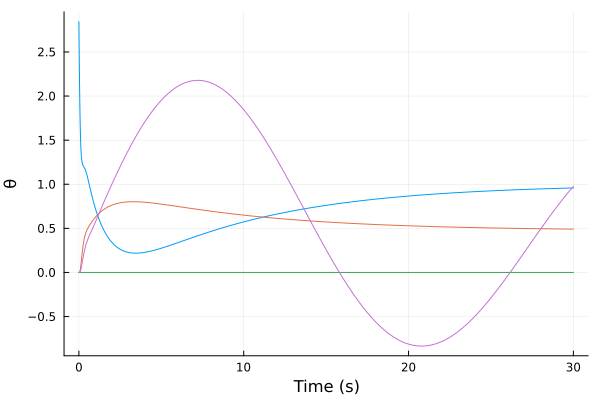

In [544]:
e2e_SAS = P_red_te[:elevator_cmd, :elevator_cmd_sp]
e2θ_SAS = P_red_te[:θ, :elevator_cmd_sp]
e2t_SAS = P_red_te[:throttle_cmd, :elevator_cmd_sp]
e2θ_ol = P_red[:θ, :elevator_cmd]
step(e2e_SAS, 30) |> plot
step(e2θ_SAS, 30) |> plot!
step(e2t_SAS, 30) |> plot!
step(e2θ_ol, 30) |> plot!

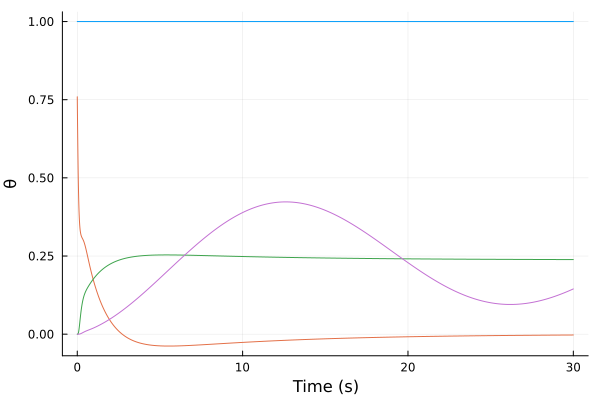

In [545]:
#we still see a slight coupling from throttle to elevator, but this is to be
#expected, because the engine can change the pitching moment and the pitch SAS
#tries to counteract this. however, the advantage of this design is that we
#retain explicit control over throttle_cmd, since it is not part of the feedback
#architecture
t2t_SAS = P_red_te[:throttle_cmd, :throttle_cmd_sp]
t2e_SAS = P_red_te[:elevator_cmd, :throttle_cmd_sp]
t2θ_SAS = P_red_te[:θ, :throttle_cmd_sp]
t2θ_ol = P_red[:θ, :throttle_cmd]
# e2t_SAS = P_red_te[:throttle_cmd, :elevator_cmd_sp]
# e2θ_ol = P_red[:θ, :elevator_cmd]
step(t2t_SAS, 30) |> plot
step(t2e_SAS, 30) |> plot!
step(t2θ_SAS, 30) |> plot!
step(t2θ_ol, 30) |> plot!
# step(e2t_SAS, 30) |> plot!
# step(e2θ_ol, 30) |> plot!

## 2. Throttle + Pitch Rate Control Augmentation

We now design a pitch rate CAS on top of the stabilized plant using classical SISO techniques.

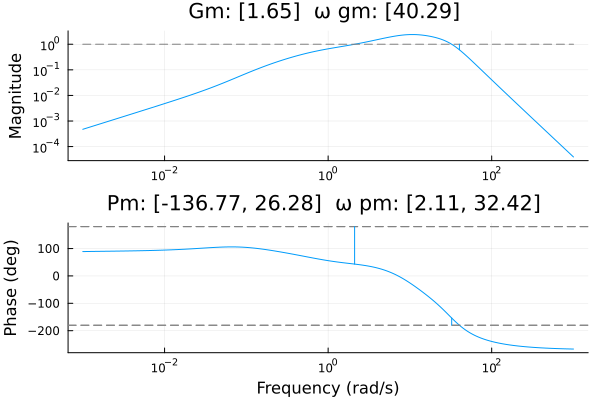

In [546]:
P_e2q = P_red_te[:q, :elevator_cmd_sp]
marginplot(P_e2q)

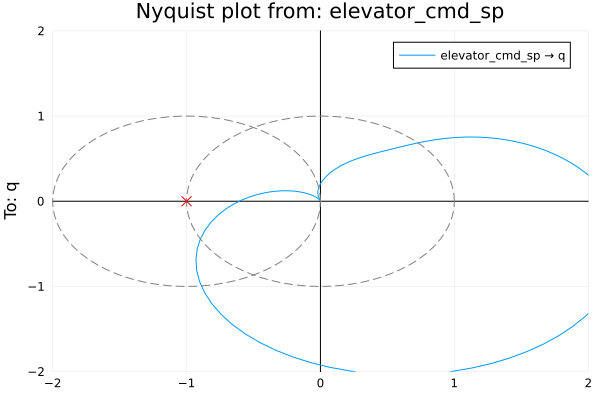

In [547]:
nyquistplot(P_e2q; unit_circle = true, Ms_circles = [1.0])
plot!(ylims = (-2,2), xlims = (-2,2))

In [548]:
q2e_int = tf(1, [1, 0]) |> ss
P_q2e_opt = series(q2e_int, ss(P_e2q))

t_sim_q2e = 10
lower_bounds = PIDParams(; k_p = 0.1, k_i = 0.0, k_d = 0.0, τ_f = 0.01)
upper_bounds = PIDParams(; k_p = 10.0, k_i = 35.0, k_d = 1.5, τ_f = 0.01)
settings = Settings(; t_sim = t_sim_q2e, lower_bounds, upper_bounds)
weights = Metrics(; Ms = 2, ∫e = 10, ef = 2, ∫u = 0.1, up = 0.00)
params_0 = PIDParams(; k_p = 1.5, k_i = 10, k_d = 0.2, τ_f = 0.01)

q2e_results = optimize_PID(P_q2e_opt; params_0, settings, weights, global_search = false)

@unpack k_p, k_i, k_d, T_i, T_d = q2e_results.params
@unpack k_p, k_i, k_d, T_i, T_d = q2e_results.params
@show k_p, k_i, k_d, T_i, T_d
@show q2e_results.metrics
@show q2e_results.exit_flag

(k_p, k_i, k_d, T_i, T_d) = (1.2503073872387969, 10.25002920788247, 0.08730874329600864, 0.12198086092059976, 0.06982982279967406)
q2e_results.metrics = [1.1770753746142566, 0.03595748400521903, 0.003246604316507251, 0.40900610491985895, 8.98118171683966]
q2e_results.exit_flag = :ROUNDOFF_LIMITED


:ROUNDOFF_LIMITED

In [549]:
q2e_PID = build_PID(q2e_results.params)
# q2e_PID = build_PID(PIDParams(; k_p = 1.594, k_i = 15.216, k_d = 0.102))
C_q2e = named_ss(series(q2e_int, q2e_PID), :C_q2e; u = :q_err, y = :elevator_cmd_sp);

StepInfo:
Initial value:     0.000
Final value:       0.997
Step size:         0.997
Peak:              1.159
Peak time:         0.790 s
Overshoot:         16.31 %
Undershoot:         0.00 %
Settling time:     1.565 s
Rise time:         0.317 s


ε_q2e_cl(0) = [0.0;;]


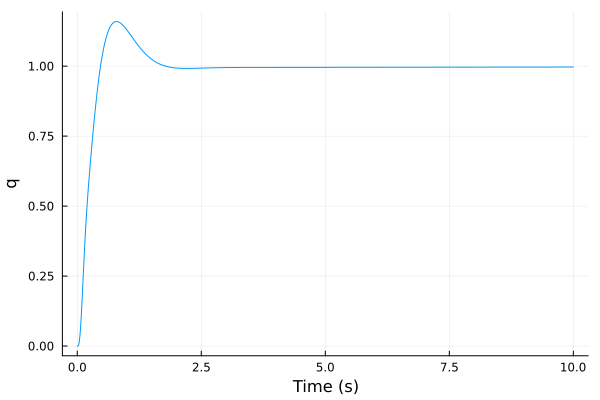

In [550]:
#steady-state error for a unit step input, now zero
L_q2e = series(C_q2e, P_e2q)
ε_q2e_cl = 1/(1+tf(L_q2e))
@show ε_q2e_cl(0)

T_q2e = output_comp_sensitivity(P_e2q, C_q2e) #this is the closed loop transfer function
T_q2e_step = step(T_q2e, t_sim_q2e)
stepinfo(T_q2e_step) |> display
T_q2e_step |> plot

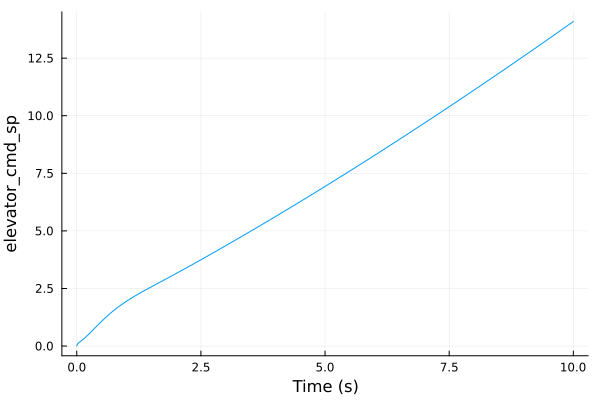

In [551]:
CS_q2e = G_CS(P_e2q, C_q2e)
CS_q2e_step = step(CS_q2e, t_sim_q2e)
CS_q2e_step |> plot

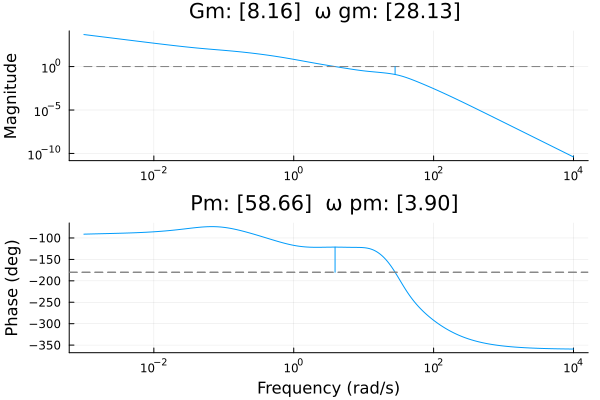

In [552]:
marginplot(L_q2e)

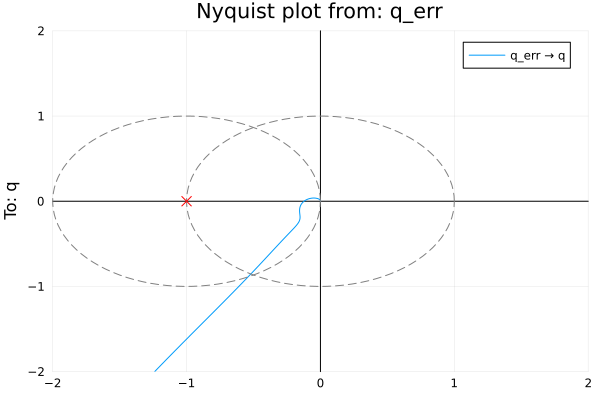

In [553]:
nyquistplot(L_q2e; unit_circle = true, Ms_circles = [1.0])
plot!(ylims = (-2,2), xlims = (-2,2))

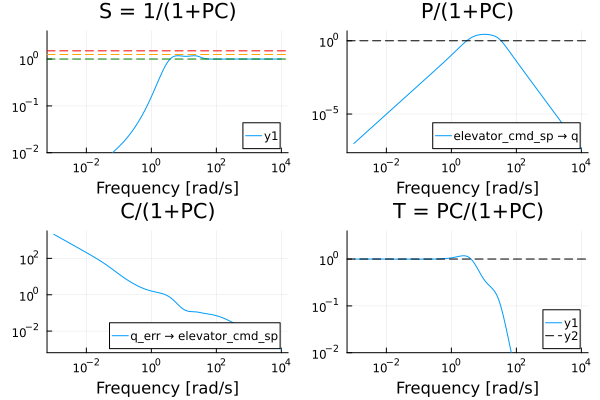

In [554]:
gangoffourplot(P_e2q, C_q2e)

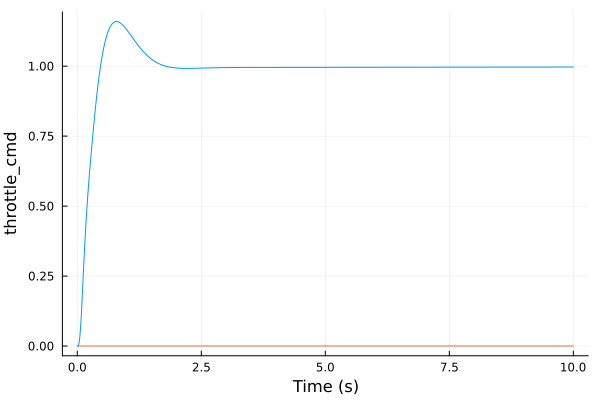

In [556]:
q2e_sum = sumblock("q_err = q_sp - q")
P_tq = connect([P_red_te, q2e_sum, C_q2e], [:q_err=>:q_err, :q=>:q, :elevator_cmd_sp=>:elevator_cmd_sp], w1 = [:throttle_cmd_sp, :q_sp], z1 = P_red_te.y)

#verify we get the same response as with the SISO closed loop
qsp2q = P_tq[:q, :q_sp]
qsp2t = P_tq[:throttle_cmd, :q_sp]
qsp2e = P_tq[:elevator_cmd, :q_sp]
step(qsp2q, t_sim_q2e) |> plot
step(qsp2t, t_sim_q2e) |> plot!
# step(qsp2e, t_sim_q2e) |> plot!
#and we see that the response matches that of the SISO design

In [578]:
dampreport(P_tq)

|        Pole        |   Damping     |   Frequency   |   Frequency   | Time Constant |
|                    |    Ratio      |   (rad/sec)   |     (Hz)      |     (sec)     |
+--------------------+---------------+---------------+---------------+---------------+
| -2.73e-05          |  1            |  2.73e-05     |  4.34e-06     |  3.67e+04     |
| -0.0564            |  1            |  0.0564       |  0.00897      |  17.7         |
| -2.81   ±   2.23im |  0.784        |  3.59         |  0.571        |  0.356        |
| -7.9               |  1            |  7.9          |  1.26         |  0.127        |
| -11                |  1            |  11           |  1.75         |  0.0911       |
| -11.8              |  1            |  11.8         |  1.88         |  0.0848       |
| -16     ±   23.8im |  0.557        |  28.6         |  4.56         |  0.0627       |
| -18.8   ±   25.1im |  0.6          |  31.4         |  5            |  0.0531       |
| -46.8              |  1            |  46.

## 3. EAS + Pitch Rate Control Augmentation

To design a SISO EAS-to-throttle controller, we should start from the SAS plant with additional pitch rate control. The throttle-to-EAS response of the raw SAS plant is unsuitable. The raw SAS plant tracks throttle_cmd and elevator_cmd directly, so when a throttle_cmd step input is applied, the plant settles on a new equilibrium in which elevator_cmd remains the same and throttle_cmd has increased. In some cases this equilibrium has a higher pitch angle and a lower EAS than before. So this leads to the unintuitive scenario in which an increase in throttle actually causes airspeed to decrease. This behaviour is fixed by the external q loop, because by maintaining pitch attitude it ensures that the throttle increase will actually lead to an airspeed increase.

|        Pole        |   Damping     |   Frequency   |   Frequency   | Time Constant |
|                    |    Ratio      |   (rad/sec)   |     (Hz)      |     (sec)     |
+--------------------+---------------+---------------+---------------+---------------+
| -2.73e-05          |  1            |  2.73e-05     |  4.34e-06     |  3.67e+04     |
| -0.0564            |  1            |  0.0564       |  0.00897      |  17.7         |
| -2.81   ±   2.23im |  0.784        |  3.59         |  0.571        |  0.356        |
| -7.9               |  1            |  7.9          |  1.26         |  0.127        |
| -11                |  1            |  11           |  1.75         |  0.0911       |
| -11.8              |  1            |  11.8         |  1.88         |  0.0848       |
| -16     ±   23.8im |  0.557        |  28.6         |  4.56         |  0.0627       |
| -18.8   ±   25.1im |  0.6          |  31.4         |  5            |  0.0531       |
| -46.8              |  1            |  46.

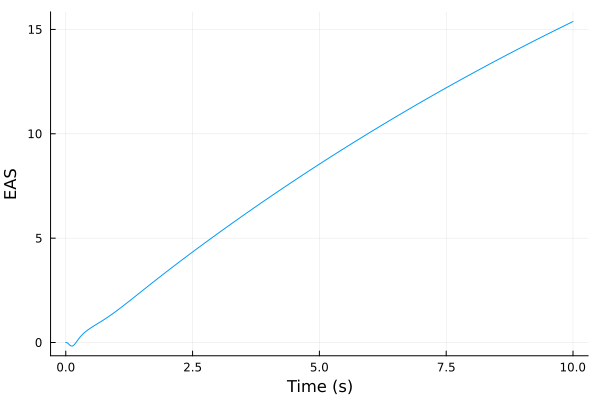

In [557]:
P_t2v = P_tq[:EAS, :throttle_cmd]
dampreport(P_t2v)
step(P_t2v, 10) |> plot

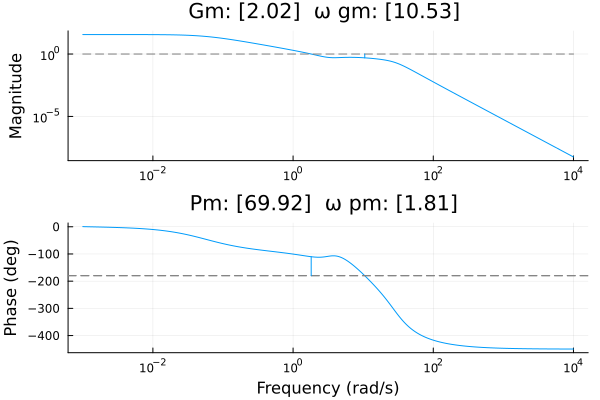

In [558]:
#error transfer function for a unit feedback closed loop and a unit step input
marginplot(P_t2v)

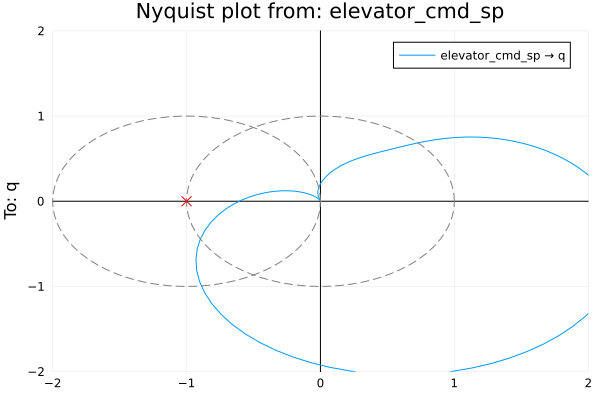

In [559]:
nyquistplot(P_e2q; unit_circle = true, Ms_circles = [1.0])
plot!(ylims = (-2,2), xlims = (-2,2))

In [581]:
t_sim_v2t = 10
lower_bounds = PIDParams(; k_p = 0.01, k_i = 0.0, k_d = 0.0, τ_f = 0.01)
upper_bounds = PIDParams(; k_p = 1.0, k_i = 2.0, k_d = 0.0, τ_f = 0.01)
settings = Settings(; t_sim = t_sim_v2t, maxeval = 5000, lower_bounds, upper_bounds)
weights = Metrics(; Ms = 5.0, ∫e = 5.0, ef = 1.0, ∫u = 0.0, up = 0.0)
params_0 = PIDParams(; k_p = 0.2, k_i = 0.1, k_d = 0.0, τ_f = 0.01)

v2t_results = optimize_PID(P_t2v; params_0, settings, weights, global_search = false)
v2t_PID = build_PID(v2t_results.params)

C_v2t = named_ss(ss(v2t_PID), :C_v2t; u = :EAS_err, y = :throttle_cmd_sp)
L_v2t = series(C_v2t, P_t2v)

@unpack k_p, k_i, k_d, T_i, T_d = v2t_results.params
@show k_p, k_i, k_d, T_i, T_d
@show v2t_results.metrics
@show v2t_results.exit_flag

(k_p, k_i, k_d, T_i, T_d) = (0.25301507022651126, 0.01719077023551534, 0.0, 14.718076430560032, 0.0)
v2t_results.metrics = [1.1454219490083595, 0.18539097675314933, 0.011642952738784906, 0.9274216844973555, 0.9718568799546833]
v2t_results.exit_flag = :ROUNDOFF_LIMITED


:ROUNDOFF_LIMITED

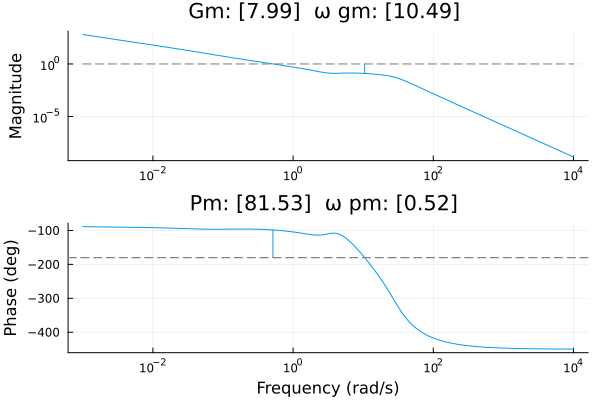

In [582]:
marginplot(L_v2t)

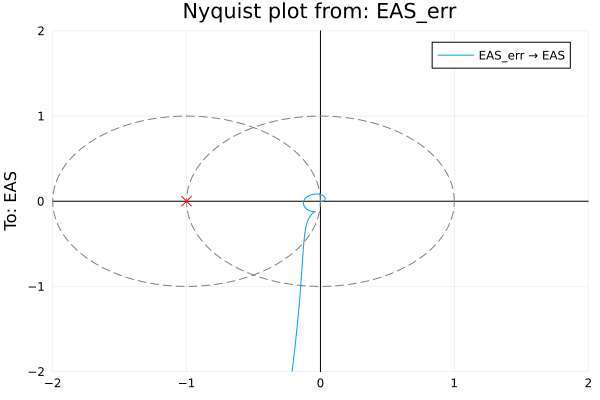

In [583]:
nyquistplot(L_v2t; unit_circle = true, Ms_circles = [1.0])
plot!(ylims = (-2,2), xlims = (-2,2))

StepInfo:
Initial value:     0.000
Final value:       1.012
Step size:         1.012
Peak:              1.012
Peak time:         9.999 s
Overshoot:          0.00 %
Undershoot:         4.33 %
Settling time:     6.395 s
Rise time:         3.720 s


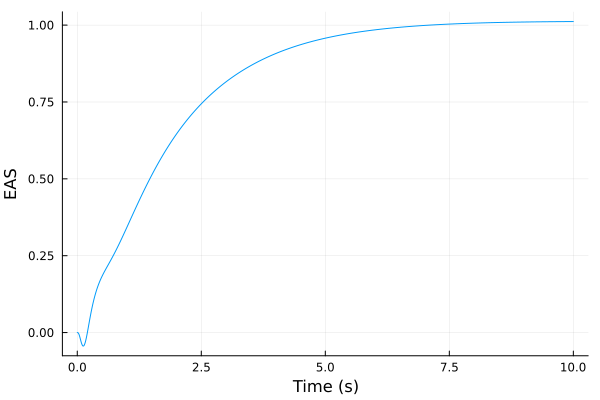

In [584]:
T_v2t = output_comp_sensitivity(P_t2v, C_v2t)
T_v2t_step = step(T_v2t, t_sim_v2t)
stepinfo(T_v2t_step) |> display
T_v2t_step |> plot

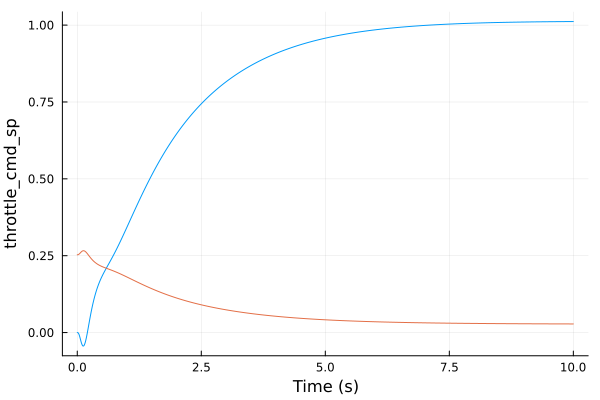

In [564]:
CS_v2t = G_CS(P_t2v, C_v2t)
CS_v2t_step = step(CS_v2t, t_sim_v2t)
CS_v2t_step |> plot!

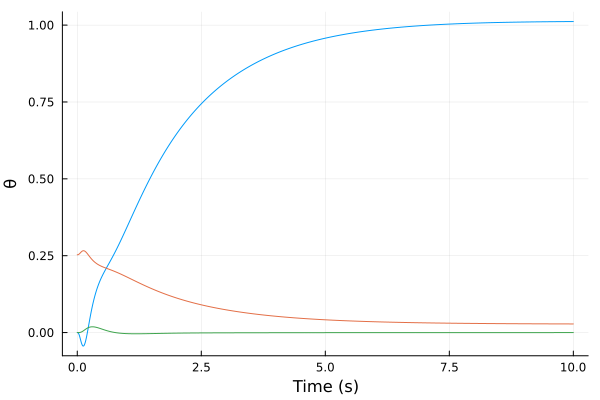

In [565]:
v2t_sum = sumblock("EAS_err = EAS_sp - EAS")
P_vq = connect([P_tq, v2t_sum, C_v2t], [:EAS_err=>:EAS_err, :EAS=>:EAS, :throttle_cmd_sp=>:throttle_cmd_sp], w1 = [:EAS_sp, :q_sp], z1 = P_tq.y)

#check we get the same response as with the SISO closed loop
EASsp2EAS = P_vq[:EAS, :EAS_sp]
EASsp2thr = P_vq[:throttle_cmd, :EAS_sp]
EASsp2θ = P_vq[:θ, :EAS_sp]
step(EASsp2EAS, t_sim_v2t) |> plot
step(EASsp2thr, t_sim_v2t) |> plot!
step(EASsp2θ, t_sim_v2t) |> plot!

## 4. Throttle + EAS Control Augmentation


We start with the throttle + q plant. We leave the throttle alone and design a EAS to q SISO loop.

In [566]:
#verify we get the same response as with the SISO closed loop
P_q2v = P_tq[:EAS, :q_sp]
# qsp2t = P_tq[:throttle_cmd, :q_sp]
# qsp2e = P_tq[:elevator_cmd, :q_sp]
step(P_q2v, 10) |> plot
# step(qsp2t, t_sim_q2e) |> plot!
# step(qsp2e, t_sim_q2e) |> plot!
cl = feedback(P_q2v)

NamedStateSpace{Continuous, Float64}
A = 
   -5.078949107383082      -4.167879027611784e-6    0.074156245846182      -3.8444491925569624       147.51432901502343     0.003700739609556766    0.0                  14.004651743493586      0.0                  0.0                0.0
    0.9999996010134947     -1.548290320024961e-13   1.5777232316669375e-7   3.7166106111669373e-9      0.0                  0.0                     0.0                   0.0                    0.0                  0.0                0.0
    1.8548973488386586     -9.774371454621168      -0.1320616842238497      2.437498341658077        -90.83306520145874     0.018729970926577962    0.0                  -8.022238558382355      0.0                  0.0                0.0
   51.12154944482841       -0.23024690276917847    -0.29856027244316413    -3.128537615071197         32.529069086825835    6.195775013058524e-5    0.0                   4.955960441625887      0.0                  0.0                0.0
    0.0   

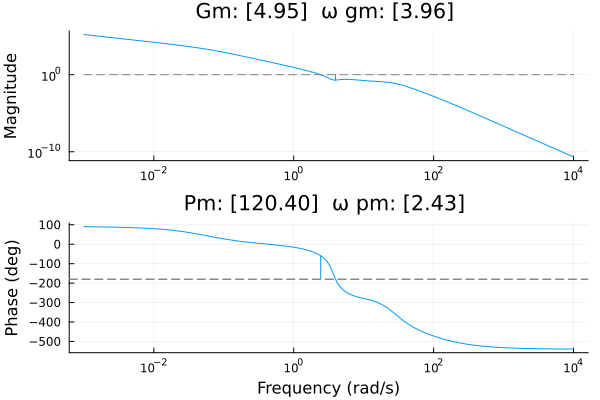

In [567]:
marginplot(P_q2v)

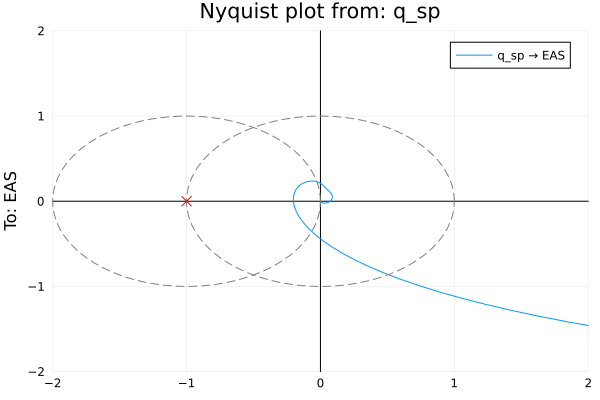

In [568]:
nyquistplot(P_q2v; unit_circle = true, Ms_circles = [1.0])
plot!(ylims = (-2,2), xlims = (-2,2))

## 5. EAS + Climb Rate Control

We start again from the non-stabilized plant. This is a true MIMO control mode with integral control in both command variables, and it requires completely new gain matrices.

In [569]:
#define command variables
z_labels = [:EAS, :climb_rate]
@assert tuple(z_labels...) === propertynames(C172MCS.ZLonEASClm())
z_trim = lss_red.y0[z_labels]
n_z = length(z_labels)

z_labels_sp = Symbol.(string.(z_labels) .* "_sp")


2-element Vector{Symbol}:
 :EAS_sp
 :climb_rate_sp

In [570]:
F = lss_red.A
G = lss_red.B
Hx = lss_red.C[z_labels, :]
Hu = lss_red.D[z_labels, :]
display(Hx)
display(Hu)

#define the blocks corresponding to the subset of the command variables for
#which integral compensation is required. in this case, both
Hx_int = Hx[z_labels, :]
Hu_int = Hu[z_labels, :]
n_int, _ = size(Hx_int)

F_aug = [F zeros(n_x, n_int); Hx_int zeros(n_int, n_int)]
G_aug = [G; Hu_int]
Hx_aug = [Hx zeros(n_z, n_int)]
Hu_aug = Hu

P_aug = ss(F_aug, G_aug, Hx_aug, Hu_aug)
controllability(F_aug, G_aug)

2×10 ComponentMatrix{Float64} with axes Axis(EAS = 1, climb_rate = 2) × Axis(q = 1, θ = 2, v_x = 3, v_z = 4, α_filt = 5, ω_eng = 6, thr_v = 7, thr_p = 8, ele_v = 9, ele_p = 10)
 0.0   0.0     0.950817    0.0223979  0.0  0.0  0.0  0.0  0.0  0.0
 0.0  52.5718  0.0235503  -0.999722   0.0  0.0  0.0  0.0  0.0  0.0

2×2 ComponentMatrix{Float64} with axes Axis(EAS = 1, climb_rate = 2) × Axis(throttle_cmd = 1, elevator_cmd = 2)
 0.0  0.0
 0.0  0.0

(iscontrollable = true, ranks = [12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12], sigma_min = [0.0049310134597672075, 1.2063357469382008, 1.2063357469382008, 1.2063357469382026, 1.2063357469382026, 0.43886148086323407, 0.4343293952750196, 0.4343293952750196, 0.02123576595856798, 0.02123576595856798, 0.00686433317966284, 0.00686433317966284])

In [571]:
@unpack v_x, v_z = lss_red.x0
v_norm = norm([v_x, v_z])

#weight matrices
Q = ComponentVector(q = 1, θ = 100, v_x = 10/v_norm, v_z = 1/v_norm, α_filt = 1, ω_eng = 0, thr_v = 0.0, thr_p = 0, ele_v = 0, ele_p = 0, ξ_EAS = 0.005, ξ_climb_rate = 0.001) |> diagm
R = C172MCS.ULon(throttle_cmd = 1, elevator_cmd = 1) |> diagm

#compute gain matrix
C_aug = lqr(P_aug, Q, R)

# quickly construct the closed-loop augmented system to check the resulting
# eigenvalues, we'll do the connections properly later
F_aug_cl = F_aug - G_aug * C_aug
P_aug_cl = ss(F_aug_cl, G_aug, Hx_aug, Hu_aug)

dampreport(P_aug)
dampreport(P_aug_cl)

|        Pole        |   Damping     |   Frequency   |   Frequency   | Time Constant |
|                    |    Ratio      |   (rad/sec)   |     (Hz)      |     (sec)     |
+--------------------+---------------+---------------+---------------+---------------+
| +0                 |  -1           |  0            |  0            |  -Inf         |
| +0                 |  -1           |  0            |  0            |  -Inf         |
| -0.0194 ±  0.231im |  0.0838       |  0.232        |  0.0369       |  51.4         |
| -5.54   ±   6.27im |  0.662        |  8.37         |  1.33         |  0.18         |
| -11.7              |  1            |  11.7         |  1.86         |  0.0857       |
| -18.8   ±   25.1im |  0.6          |  31.4         |  5            |  0.0531       |
| -18.8   ±   25.1im |  0.6          |  31.4         |  5            |  0.0531       |
| -47.2              |  1            |  47.2         |  7.51         |  0.0212       |
|        Pole        |   Damping     |   Fr

In [572]:
#extract system state and integrator blocks from the feedback matrix
C_x = C_aug[:, 1:n_x]
C_ξ = C_aug[:, n_x+1:end]
display(C_ξ)

2×2 Matrix{Float64}:
  0.0659384  0.0114204
 -0.0255367  0.0294886

In [573]:
A = [F G; Hx Hu]
B = inv(A)
B_12 = B[1:n_x, n_x+1:end]
B_22 = B[n_x+1:end, n_x+1:end]

C_fbk = C_x
C_fwd = B_22 + C_x * B_12
C_int = C_ξ

#some useful signal labels
u_labels_red_fbk = Symbol.(string.(u_labels_red) .* "_fbk")
u_labels_red_fwd = Symbol.(string.(u_labels_red) .* "_fwd")
u_labels_red_sum = Symbol.(string.(u_labels_red) .* "_sum")
u_labels_red_int_u = Symbol.(string.(u_labels_red) .* "_int_u")
u_labels_red_int = Symbol.(string.(u_labels_red) .* "_int")
u_labels_red_ξ = Symbol.(string.(u_labels_red) .* "_ξ")

z_labels_sp = Symbol.(string.(z_labels) .* "_sp")
z_labels_sp1 = Symbol.(string.(z_labels) .* "_sp1")
z_labels_sp2 = Symbol.(string.(z_labels) .* "_sp2")
z_labels_err = Symbol.(string.(z_labels) .* "_err")
z_labels_sum = Symbol.(string.(z_labels) .* "_sum")
z_labels_sp_fwd = Symbol.(string.(z_labels) .* "_sp_fwd")
z_labels_sp_sum = Symbol.(string.(z_labels) .* "_sp_sum")

C_fbk_ss = named_ss(ss(C_fbk), u = x_labels_red, y = u_labels_red_fbk)
C_fwd_ss = named_ss(ss(C_fwd), u = z_labels_sp_fwd, y = u_labels_red_fwd)
C_int_ss = named_ss(ss(C_int), u = z_labels_err, y = u_labels_red_int_u)

int_ss = named_ss(ss(tf(1, [1,0])) .* I(2),
                    x = u_labels_red_ξ,
                    u = u_labels_red_int_u,
                    y = u_labels_red_int);

EAS_err_sum = sumblock("EAS_err = EAS_sum - EAS_sp_sum")
climb_rate_err_sum = sumblock("climb_rate_err = climb_rate_sum - climb_rate_sp_sum")

throttle_cmd_sum = sumblock("throttle_cmd_sum = throttle_cmd_fwd - throttle_cmd_fbk - throttle_cmd_int")
elevator_cmd_sum = sumblock("elevator_cmd_sum = elevator_cmd_fwd - elevator_cmd_fbk - elevator_cmd_int")

EAS_sp_splitter = splitter(:EAS_sp, 2)
climb_rate_sp_splitter = splitter(:climb_rate_sp, 2)

connections = vcat(
    Pair.(x_labels_red, x_labels_red),
    Pair.(z_labels, z_labels_sum),
    Pair.(z_labels_sp1, z_labels_sp_sum),
    Pair.(z_labels_sp2, z_labels_sp_fwd),
    Pair.(z_labels_err, z_labels_err),
    Pair.(u_labels_red_sum, u_labels_red),
    Pair.(u_labels_red_fwd, u_labels_red_fwd),
    Pair.(u_labels_red_fbk, u_labels_red_fbk),
    Pair.(u_labels_red_int, u_labels_red_int),
    Pair.(u_labels_red_int_u, u_labels_red_int_u),
    )

P_vc = connect([P_lon, int_ss, C_fwd_ss, C_fbk_ss, C_int_ss,
                    EAS_err_sum, climb_rate_err_sum,
                    throttle_cmd_sum, elevator_cmd_sum,
                    EAS_sp_splitter, climb_rate_sp_splitter], connections;
                    w1 = z_labels_sp, z1 = P_lon.y)

# P_vc = connect([P_red, int_ss, C_fwd_ss, C_fbk_ss, C_int_ss,
#                     EAS_err_sum, climb_rate_err_sum,
#                     throttle_cmd_sum, elevator_cmd_sum,
#                     EAS_sp_splitter, climb_rate_sp_splitter], connections;
#                     w1 = z_labels_sp, z1 = P_red.y)
dampreport(P_vc)
display(C_fbk_ss)
display(C_fwd_ss)
display(C_int_ss)
display(int_ss)


P_vc

NamedStateSpace{Continuous, Float64}
D = 
 0.2431788379635348  -0.7442517664627181   0.45781410288112934   0.01705139766090362  -0.08961591684665837  0.0007959028673894538   0.0009637978832730576   0.03679403752917492     -5.164902918870582e-5  -0.004529314788239424
 1.0359098863144967  11.597560504199974   -0.13900043767043302  -0.13762185403836666   3.1135951439093104   1.314374227229823e-5   -5.164902918870582e-5   -0.00011206489777727965   0.013692927671002976   0.6087382278408365

Continuous-time state-space model
With state  names: 
     input  names: q θ v_x v_z α_filt ω_eng thr_v thr_p ele_v ele_p
     output names: throttle_cmd_fbk elevator_cmd_fbk


NamedStateSpace{Continuous, Float64}
D = 
  0.49864026055183824  0.0813945580374517
 -0.19730967360882817  0.2150141759669645

Continuous-time state-space model
With state  names: 
     input  names: EAS_sp_fwd climb_rate_sp_fwd
     output names: throttle_cmd_fwd elevator_cmd_fwd


NamedStateSpace{Continuous, Float64}
D = 
  0.0659384292205285   0.011420363852785897
 -0.02553670989110324  0.02948856200959006

Continuous-time state-space model
With state  names: 
     input  names: EAS_err climb_rate_err
     output names: throttle_cmd_int_u elevator_cmd_int_u


NamedStateSpace{Continuous, Float64}
A = 
 0.0  0.0
 0.0  0.0
B = 
 1.0  0.0
 0.0  1.0
C = 
 1.0  0.0
 0.0  1.0
D = 
 0.0  0.0
 0.0  0.0

Continuous-time state-space model
With state  names: throttle_cmd_ξ elevator_cmd_ξ
     input  names: throttle_cmd_int_u elevator_cmd_int_u
     output names: throttle_cmd_int elevator_cmd_int


|        Pole        |   Damping     |   Frequency   |   Frequency   | Time Constant |
|                    |    Ratio      |   (rad/sec)   |     (Hz)      |     (sec)     |
+--------------------+---------------+---------------+---------------+---------------+
| -2.38e-15          |  1            |  2.38e-15     |  3.78e-16     |  4.21e+14     |
| -0.147             |  1            |  0.147        |  0.0234       |  6.81         |
| -0.162             |  1            |  0.162        |  0.0257       |  6.19         |
| -1.28   ± 0.0658im |  0.999        |  1.29         |  0.205        |  0.779        |
| -11.6              |  1            |  11.6         |  1.85         |  0.086        |
| -12     ±   6.41im |  0.882        |  13.6         |  2.17         |  0.0833       |
| -18.8   ±   25.1im |  0.6          |  31.4         |  5            |  0.0531       |
| -18.2   ±   26.8im |  0.562        |  32.4         |  5.16         |  0.0549       |
| -47.1              |  1            |  47.

NamedStateSpace{Continuous, Float64}
A = 
    -5.078949107383082       -4.167879027611784e-6      0.074156245846182       -3.8444491925569624      6.60954228263296e-7       147.51432901502343     0.003700739609556766    0.0                      0.0                    0.0                      14.004651743493586     0.0                 0.0
     0.9999996010134947      -1.548290320024961e-13     1.5777232316669375e-7    3.7166106111669373e-9  -1.3093480728279614e-12      0.0                  0.0                     0.0                      0.0                    0.0                       0.0                   0.0                 0.0
     1.8548973488386586      -9.774371454621168        -0.1320616842238497       2.437498341658077      -1.9430531300316932e-5     -90.83306520145874     0.018729970926577962    0.0                      0.0                    0.0                      -8.022238558382355     0.0                 0.0
    51.12154944482841        -0.23024690276917847      -0.298560

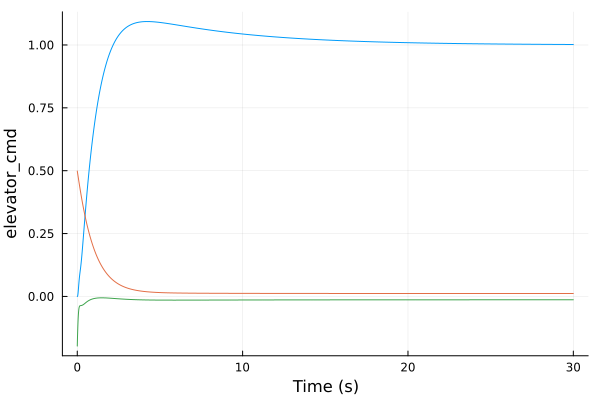

In [574]:
EASsp2EAS = P_vc[:EAS, :EAS_sp]
EASsp2thr = P_vc[:throttle_cmd, :EAS_sp]
EASsp2ele = P_vc[:elevator_cmd, :EAS_sp]
step(EASsp2EAS, 30) |> plot
step(EASsp2thr, 30) |> plot!
step(EASsp2ele, 30) |> plot!

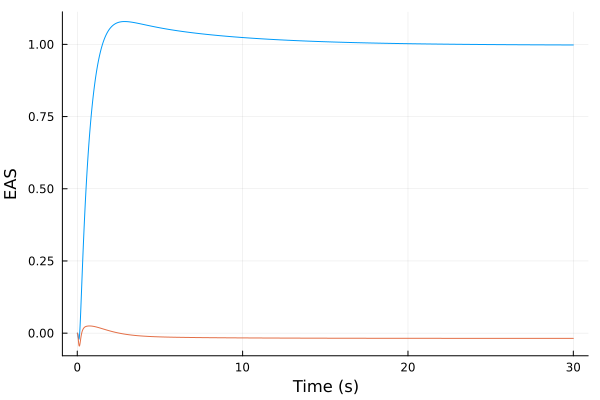

In [575]:
crsp2cr = P_vc[:climb_rate, :climb_rate_sp]
crsp2EAS = P_vc[:EAS, :climb_rate_sp]
# crsp2ele = P_vc[:elevator_cmd, :climb_rate_sp]
# crsp2thr = P_vc[:throttle_cmd, :climb_rate_sp]
step(crsp2cr, 30) |> plot
step(crsp2EAS, 30) |> plot!
# step(crsp2ele, 30) |> plot!
# step(crsp2thr, 30) |> plot!

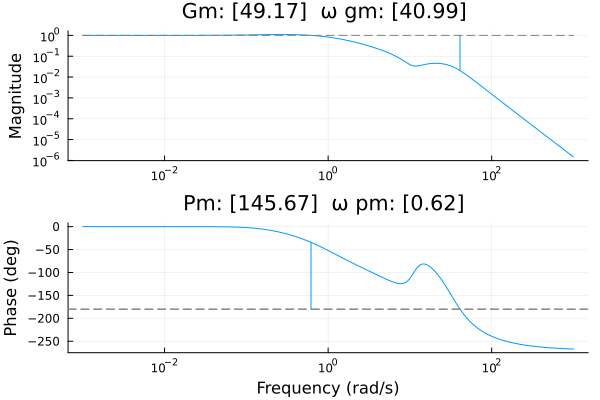

In [576]:
marginplot(EASsp2EAS)

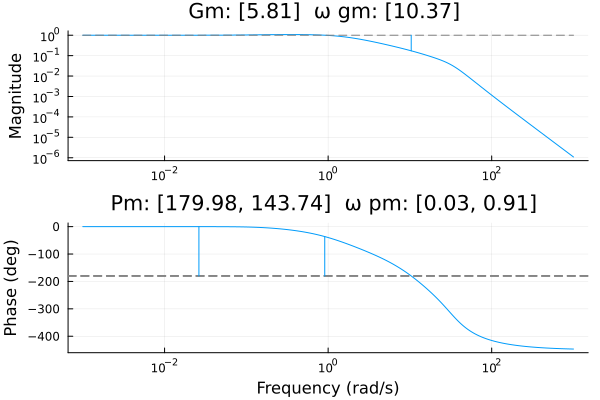

In [577]:
marginplot(crsp2cr)